In [1]:
import sys

sys.path.insert(0,'../..')
sys.path.insert(1,'../../python_env/Lib/site-packages')

In [2]:
from tqdm import tqdm
import pandas as pd
from plotly import express as px

from agents.nstep_td import nStepSarsaAgent, nStepQLearningAgent
from envs.taxi_env import TaxiEnv
from rl_task import RLTask
from metrics import NumStepsMetric, ReturnMetric
from visualization import *

pygame 2.6.0 (SDL 2.28.4, Python 3.12.4)
Hello from the pygame community. https://www.pygame.org/contribute.html


In [3]:
NUM_RUNS = 5
NUM_EPISODES = 1500
PLOT_PRECISION = 50
MAX_EPISODE_STEPS = 2000

In [4]:
env = TaxiEnv()
test_env = TaxiEnv(render_mode='human')

In [5]:
num_states = env.observation_space.n
num_actions = env.action_space.n
metric_objs = [NumStepsMetric('on_episode_end'), ReturnMetric('on_episode_step')]
metric_objs_test = [NumStepsMetric('on_episode_test_end'), ReturnMetric('on_episode_test_step')]
episodes = [x for x in range(PLOT_PRECISION, NUM_EPISODES+1)]
eps_list = [0.1, 0.3]
step_size_list = [0.1, 0.3, 0.5]
num_step_list = [2**x for x in range(1, 11)]

In [6]:
def moving_average(series):
    moving_avg = [sum(series[:50])/50]
    for i in range(50, len(series)):
        moving_avg.append((moving_avg[-1]*50 - series[i-50] + series[i])/50)
    return moving_avg

def run_experiment(rl_task, metric_objs=None, metric_objs_test=None, num_runs=NUM_RUNS, num_episodes=NUM_EPISODES, random_seed = 0):
    
    np.random.seed(random_seed)
    metrics = {metric.NAME: [] for metric in metric_objs} if metric_objs is not None else {}
    metrics_test = {metric.NAME: [] for metric in metric_objs_test} if metric_objs_test is not None else {}
    episodes_test = []
    
    for i in range(num_runs):
        rl_task.agent.reset()
        for m in metrics:
            metrics[m].append([])
        for m in metrics_test:
            metrics_test[m].append([])
        for j in tqdm(range(num_episodes+1)):
            metrics_j = rl_task.run_episode(metric_objs)
            for m in metrics:
                metrics[m][-1].append(metrics_j[m])
            if j % PLOT_PRECISION == 0:
                rl_task.env.set_seed(random_seed)
                metrics_j_test = rl_task.test_episode(metric_objs_test)
                rl_task.env.set_seed(None)
                for m in metrics_test:
                    metrics_test[m][-1].append(metrics_j_test[m])
    episodes_test = [x for x in range(1, num_episodes+2, PLOT_PRECISION)]
    for m in metrics:
        metrics[m] = np.array(metrics[m]).mean(axis=0).squeeze()
        metrics[m] = moving_average(metrics[m])
    for m in metrics_test:
        metrics_test[m] = np.array(metrics_test[m]).mean(axis=0).squeeze()
        
    return metrics, metrics_test, episodes_test

# 1. On-Policy

## 1.1. Sarsa(0)

In [7]:
def get_td0_agent_info(eps, step_size):
    return  {
            'initializer_params': {'init_method': 'zero'},
            'action_selection_params': {
                'method': 'epsilon_greedy',
                'kwargs': {'eps': eps}
            },
            'step_size': step_size,
            'num_steps': 1
            }

In [8]:
metrics_list_sarsa = []
for eps in eps_list:
    for step_size in step_size_list:
        sarsa_agent = nStepSarsaAgent(num_states, num_actions, get_td0_agent_info(eps, step_size))
        rl_task_sarsa = RLTask(sarsa_agent, env, MAX_EPISODE_STEPS)
        metrics_list_sarsa.append((eps, step_size, run_experiment(rl_task_sarsa, metric_objs)))

100%|██████████| 1501/1501 [00:24<00:00, 61.85it/s] 


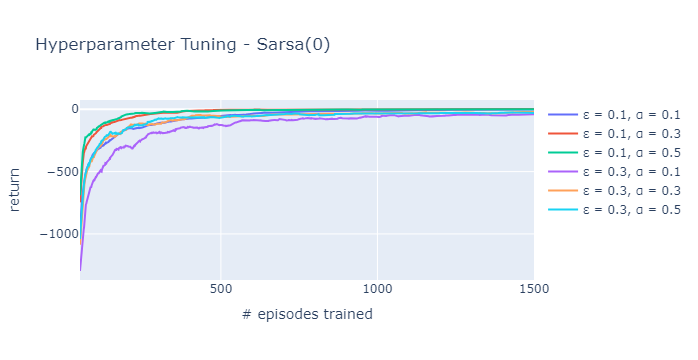

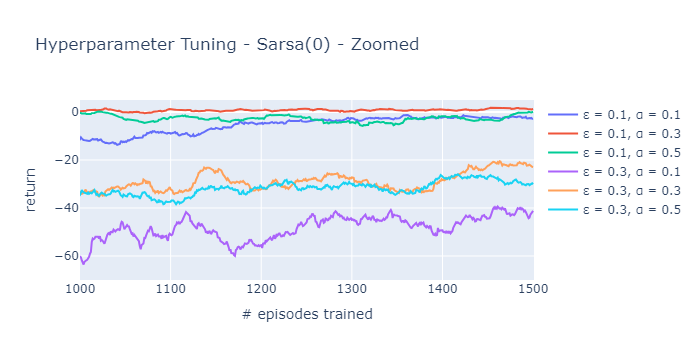

In [9]:
sarsa_return_data = []
for metric in metrics_list_sarsa:
    data = {
    'x': episodes,
    'y': np.squeeze(metric[2][0]['return']),
    'name': f'ε = {metric[0]}, α = {metric[1]}'
    }
    sarsa_return_data.append(data)

plot_figure(sarsa_return_data, title='Hyperparameter Tuning - Sarsa(0)', xtitle='# episodes trained', ytitle='return')
plot_figure(sarsa_return_data, title='Hyperparameter Tuning - Sarsa(0) - Zoomed', xtitle='# episodes trained', ytitle='return', xrange=(1000, 1501), yrange=(-70,5))

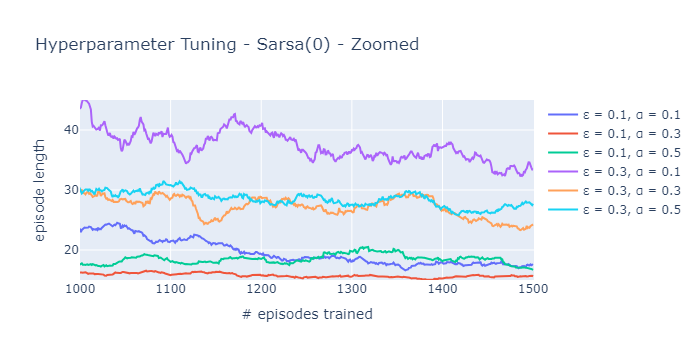

In [10]:
sarsa_num_steps_data = []
for metric in metrics_list_sarsa:
    data = {
    'x': episodes,
    'y': np.squeeze(metric[2][0]['num_steps']),
    'name': f'ε = {metric[0]}, α = {metric[1]}'
    }
    sarsa_num_steps_data.append(data)

plot_figure(sarsa_num_steps_data, title='Hyperparameter Tuning - Sarsa(0) - Zoomed', xtitle='# episodes trained', ytitle='episode length', xrange=(1000, 1501), yrange=(15,45))

In [11]:
sarsa_agent = nStepSarsaAgent(num_states, num_actions, get_td0_agent_info(0.1, 0.3))
rl_task_sarsa = RLTask(sarsa_agent, env, MAX_EPISODE_STEPS)
metrics_sarsa = run_experiment(rl_task_sarsa, metric_objs, metric_objs_test, random_seed=20)

100%|██████████| 1501/1501 [00:17<00:00, 85.10it/s] 


In [12]:
sarsa_return_data_opt = {
    'x': episodes,
    'y': np.squeeze(metrics_sarsa[0]['return']),
    'name': 'Sarsa(0)',
    'color': 'blue'
    }

In [13]:
sarsa_num_steps_data_opt = {
    'x': episodes,
    'y': np.squeeze(metrics_sarsa[0]['num_steps']),
    'name': 'Sarsa(0)',
    'color': 'blue'
    }

## 1.2. Monte Carlo

In [14]:
def get_mc_agent_info(eps, step_size):
    return  {
            'initializer_params': {'init_method': 'zero'},
            'action_selection_params': {
                'method': 'epsilon_greedy',
                'kwargs': {'eps': eps}
            },
            'step_size': step_size}

In [15]:
onpolicy_mc_agent = nStepSarsaAgent(num_states, num_actions, get_mc_agent_info(0.1, 0.3))
rl_task_onpolicy_mc = RLTask(onpolicy_mc_agent, env, MAX_EPISODE_STEPS)
metrics_onpolicy_mc = run_experiment(rl_task_onpolicy_mc, metric_objs, metric_objs_test, random_seed=50)

100%|██████████| 1501/1501 [02:15<00:00, 11.11it/s]


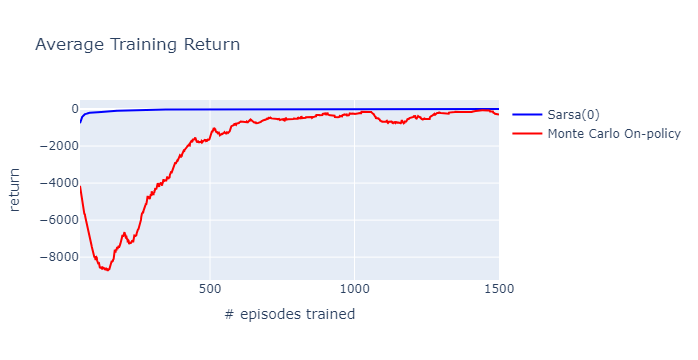

In [16]:
onpolicy_mc_return_data = {
    'x': episodes,
    'y': np.squeeze(metrics_onpolicy_mc[0]['return']),
    'name': 'Monte Carlo On-policy',
    'color': 'red'
    }

plot_figure([sarsa_return_data_opt, onpolicy_mc_return_data], title='Average Training Return', xtitle='# episodes trained', ytitle='return')

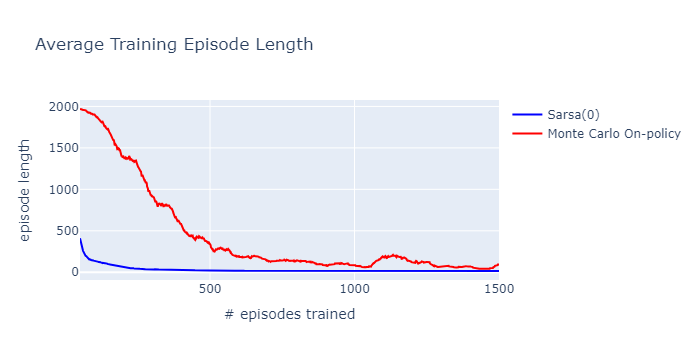

In [17]:
onpolicy_mc_num_steps_data = {
    'x': episodes,
    'y': np.squeeze(metrics_onpolicy_mc[0]['num_steps']),
    'name': 'Monte Carlo On-policy',
    'color': 'red'
    }

plot_figure([sarsa_num_steps_data_opt, onpolicy_mc_num_steps_data], title='Average Training Episode Length', xtitle='# episodes trained', ytitle='episode length')

## 1.3. n-step Sarsa

In [18]:
def get_nstep_agent_info(eps, step_size, num_steps):
    return  {
            'initializer_params': {'init_method': 'zero'},
            'action_selection_params': {
                'method': 'epsilon_greedy',
                'kwargs': {'eps': eps}
            },
            'step_size': step_size,
            'num_steps': num_steps
            }

In [19]:
metrics_list_nstep_sarsa = []
for n in num_step_list:
    nstep_sarsa_agent = nStepSarsaAgent(num_states, num_actions, get_nstep_agent_info(0.1, 0.3, n))
    rl_task_nstep_sarsa = RLTask(nstep_sarsa_agent, env, MAX_EPISODE_STEPS)
    metrics_list_nstep_sarsa.append((n, run_experiment(rl_task_nstep_sarsa, metric_objs, metric_objs_test, random_seed=50)))

100%|██████████| 1501/1501 [04:04<00:00,  6.13it/s] 


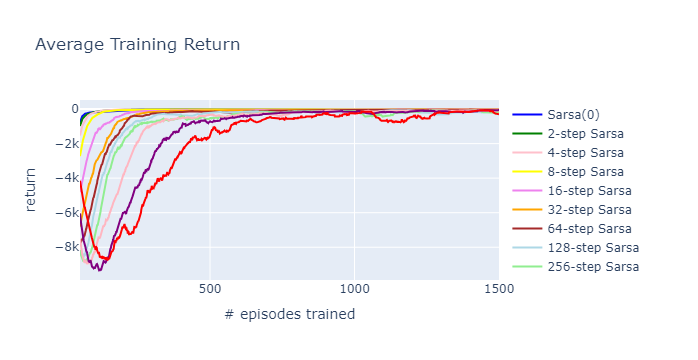

In [20]:
onpolicy_return_data = [sarsa_return_data_opt]
for i, metric in enumerate(metrics_list_nstep_sarsa):
    data = {
    'x': episodes,
    'y': np.squeeze(metric[1][0]['return']),
    'name': f'{metric[0]}-step Sarsa',
    'color': COLORS[i+2]
    }
    onpolicy_return_data.append(data)
onpolicy_return_data.append(onpolicy_mc_return_data)
plot_figure(onpolicy_return_data, title='Average Training Return', xtitle='# episodes trained', ytitle='return')

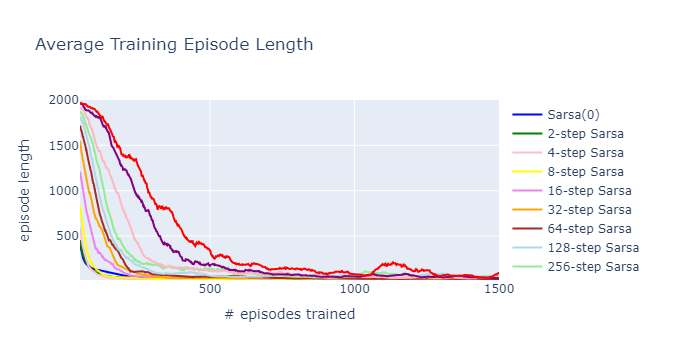

In [21]:
onpolicy_num_steps_data = [sarsa_num_steps_data_opt]
for i, metric in enumerate(metrics_list_nstep_sarsa):
    data = {
    'x': episodes,
    'y': np.squeeze(metric[1][0]['num_steps']),
    'name': f'{metric[0]}-step Sarsa',
    'color': COLORS[i+2]
    }
    onpolicy_num_steps_data.append(data)
onpolicy_num_steps_data.append(onpolicy_mc_num_steps_data)
plot_figure(onpolicy_num_steps_data, title='Average Training Episode Length', xtitle='# episodes trained', ytitle='episode length', yrange=(15,2000))

In [22]:
def metric_after_x_episodes(metric_name, episode_num, metric_td0, metric_mc, metric_list_nstep, test=False):
    ans = []
    x = []
    ans.append(metric_td0[test*1][metric_name][episode_num])
    x.append('1')
    for metric in metric_list_nstep:
        ans.append(metric[1][test*1][metric_name][episode_num])
        x.append(str(metric[0]))
    ans.append(metric_mc[test*1][metric_name][episode_num])
    x.append('MC')
    return x, ans

In [23]:
x, y = metric_after_x_episodes('return', 100, metrics_sarsa, metrics_onpolicy_mc, metrics_list_nstep_sarsa)
onpolicy_nstep_return_data = {
    'x': x,
    'y': y,
    'name': 'After 100 episodes'
    }
onpolicy_nstep_return_data_2 = {
    'x': x[:6],
    'y': y[:6],
    'name': 'After 100 episodes'
    }

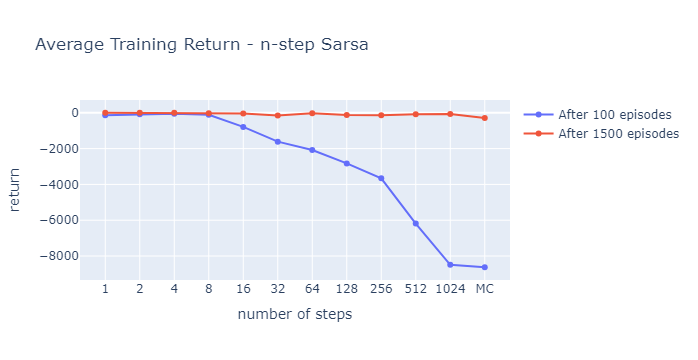

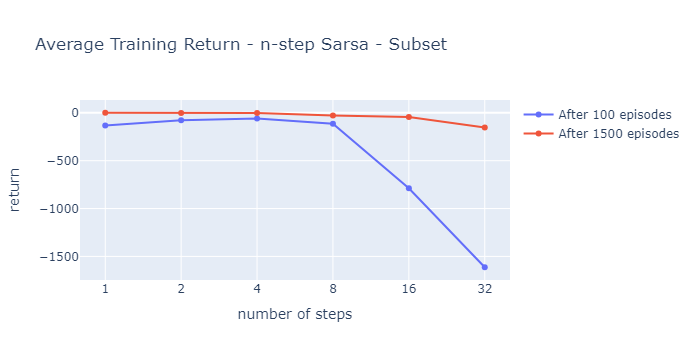

In [24]:
x, y = metric_after_x_episodes('return', -1, metrics_sarsa, metrics_onpolicy_mc, metrics_list_nstep_sarsa)
onpolicy_nstep_return_data_3 = {
    'x': x,
    'y': y,
    'name': 'After 1500 episodes'
    }
onpolicy_nstep_return_data_4 = {
    'x': x[:6],
    'y': y[:6],
    'name': 'After 1500 episodes'
    }
plot_figure([onpolicy_nstep_return_data, onpolicy_nstep_return_data_3], title='Average Training Return - n-step Sarsa', xtitle='number of steps', ytitle='return')
plot_figure([onpolicy_nstep_return_data_2, onpolicy_nstep_return_data_4], title='Average Training Return - n-step Sarsa - Subset', xtitle='number of steps', ytitle='return')

In [25]:
returns = []
x = []
np.random.seed(100)
for n in [1] + num_step_list[:3]:
    nstep_sarsa_agent = nStepSarsaAgent(num_states, num_actions, get_nstep_agent_info(0.1, 0.3, n))
    rl_task_nstep_sarsa = RLTask(nstep_sarsa_agent, env, MAX_EPISODE_STEPS)
    run_experiment(rl_task_nstep_sarsa, num_runs=1)
    for i in range(5000):
        env.set_seed(i+1)
        R = rl_task_nstep_sarsa.test_episode([metric_objs_test[1]])['return'][0]
        if R > -2000:
            returns.append(R)
            x.append(f"{n}-step Sarsa")
    env.set_seed(None)
return_df_onpolicy = pd.DataFrame(data={'n': x, 'return': returns})

100%|██████████| 1501/1501 [00:16<00:00, 90.79it/s] 


In [26]:
return_df_onpolicy.groupby("n").mean()

,return
n,
1-step Sarsa,7.767277
2-step Sarsa,6.921926
4-step Sarsa,7.395616
8-step Sarsa,6.465712


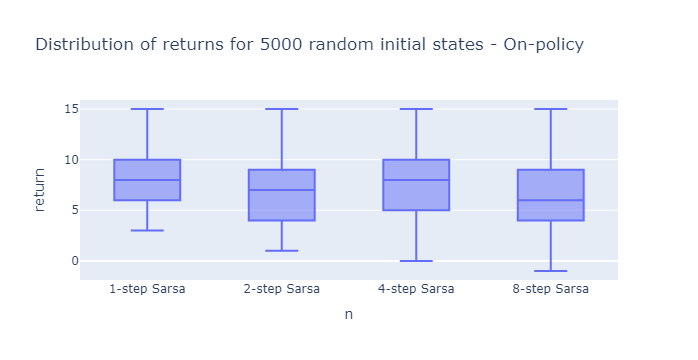

In [27]:
fig = px.box(return_df_onpolicy, x='n', y='return', title='Distribution of returns for 5000 random initial states - On-policy')
fig.show()

In [28]:
onpolicy_agent_opt = nStepSarsaAgent(num_states, num_actions, get_td0_agent_info(0.1, 0.3))
rl_task_onpolicy_opt = RLTask(onpolicy_agent_opt, env, MAX_EPISODE_STEPS)
metrics_onpolicy_opt = run_experiment(rl_task_onpolicy_opt, metric_objs_test=metric_objs_test, num_runs=1, random_seed=20)

100%|██████████| 1501/1501 [00:11<00:00, 125.18it/s]


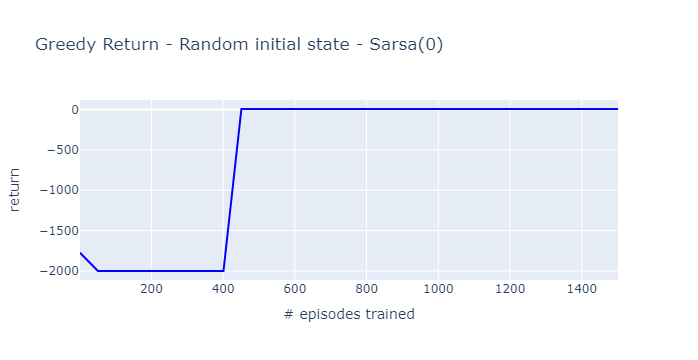

In [29]:
onpolicy_return_data_opt = {
    'x': metrics_onpolicy_opt[2],
    'y': np.squeeze(metrics_onpolicy_opt[1]['return']),
    'name': 'Sarsa(0)',
    'color': COLORS[0]
    }

plot_figure([onpolicy_return_data_opt], title='Greedy Return - Random initial state - Sarsa(0)', xtitle='# episodes trained', ytitle='return')

In [30]:
#test_env = TaxiEnv('rgb_array', save=True)
#state, _ = test_env.reset(seed=20)
#test_env.render(save=True)

In [31]:
#action = onpolicy_agent_opt.select_action(state, greedy=True)
#for i in range(MAX_EPISODE_STEPS):
#   state, reward, is_terminal, is_truncated, _ = test_env.step(action)
#   action = onpolicy_agent_opt.select_action(state, greedy=True)
#   test_env.render(save=True)
#   if is_terminal or is_truncated:
#       break

In [32]:
#test_env.close()

In [33]:
#test_env.save_gif("./onpolicy.gif", 300)
#test_env.clean_grids()

# 2. Off-Policy

## 2.1. Q-Learning

In [34]:
qlearning_agent = nStepQLearningAgent(num_states, num_actions, get_td0_agent_info(0.1, 0.3))
rl_task_qlearning = RLTask(qlearning_agent, env, MAX_EPISODE_STEPS)
metrics_qlearning = run_experiment(rl_task_qlearning, metric_objs, metric_objs_test, random_seed=50)

100%|██████████| 1501/1501 [00:15<00:00, 99.86it/s] 


In [35]:
qlearning_return_data = {
    'x': episodes,
    'y': np.squeeze(metrics_qlearning[0]['return']),
    'name': 'Q-Learning',
    'color': 'blue'
    }

In [36]:
qlearning_num_steps_data = {
    'x': episodes,
    'y': np.squeeze(metrics_qlearning[0]['num_steps']),
    'name': 'Q-Learning',
    'color': 'blue'
    }

## 2.2. Monte Carlo

In [37]:
offpolicy_mc_agent = nStepQLearningAgent(num_states, num_actions, get_mc_agent_info(0.1, 0.3))
rl_task_offpolicy_mc = RLTask(offpolicy_mc_agent, env, MAX_EPISODE_STEPS)
metrics_offpolicy_mc = run_experiment(rl_task_offpolicy_mc, metric_objs, metric_objs_test, random_seed=50)

100%|██████████| 1501/1501 [06:36<00:00,  3.78it/s]


In [38]:
offpolicy_mc_return_data = {
    'x': episodes,
    'y': np.squeeze(metrics_offpolicy_mc[0]['return']),
    'name': 'Monte Carlo Off-Policy',
    'color': 'red'
    }

In [39]:
offpolicy_mc_num_steps_data = {
    'x': episodes,
    'y': np.squeeze(metrics_offpolicy_mc[0]['num_steps']),
    'name': 'Monte Carlo Off-Policy',
    'color': 'red'
    }

## 2.3. Q(σ=1)

In [40]:
metrics_list_qsigma1 = []
for n in num_step_list:
    qsigma1_agent = nStepQLearningAgent(num_states, num_actions, get_nstep_agent_info(0.1, 0.3, n))
    rl_task_qsigma1 = RLTask(qsigma1_agent, env, MAX_EPISODE_STEPS)
    metrics_list_qsigma1.append((n, run_experiment(rl_task_qsigma1, metric_objs, metric_objs_test, random_seed=50)))

100%|██████████| 1501/1501 [01:16<00:00, 19.57it/s] 


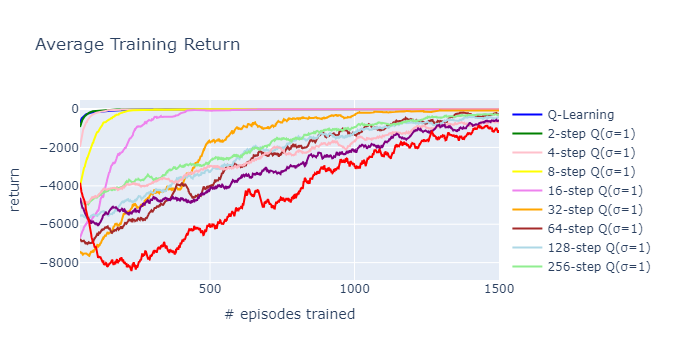

In [41]:
qsigma1_return_data = [qlearning_return_data]
for i, metric in enumerate(metrics_list_qsigma1):
    data = {
    'x': episodes,
    'y': np.squeeze(metric[1][0]['return']),
    'name': f'{metric[0]}-step Q(σ=1)',
    'color': COLORS[i+2]
    }
    qsigma1_return_data.append(data)
qsigma1_return_data.append(offpolicy_mc_return_data)
plot_figure(qsigma1_return_data, title='Average Training Return', xtitle='# episodes trained', ytitle='return')

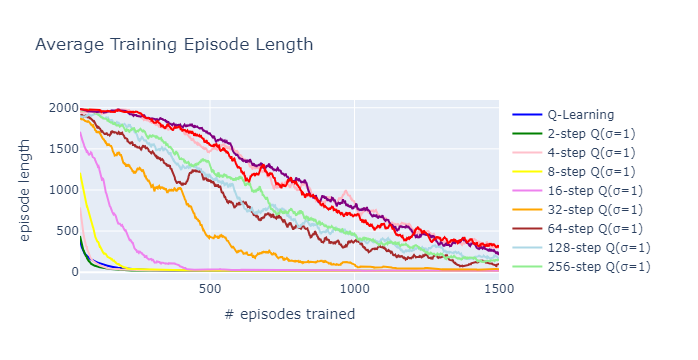

In [42]:
qsigma1_num_steps_data = [qlearning_num_steps_data]
for i, metric in enumerate(metrics_list_qsigma1):
    data = {
    'x': episodes,
    'y': np.squeeze(metric[1][0]['num_steps']),
    'name': f'{metric[0]}-step Q(σ=1)',
    'color': COLORS[i+2]
    }
    qsigma1_num_steps_data.append(data)
qsigma1_num_steps_data.append(offpolicy_mc_num_steps_data)
plot_figure(qsigma1_num_steps_data, title='Average Training Episode Length', xtitle='# episodes trained', ytitle='episode length')

In [43]:
x, y = metric_after_x_episodes('return', 100, metrics_qlearning, metrics_offpolicy_mc, metrics_list_qsigma1)
qsigma1_return_data = {
    'x': x,
    'y': y,
    'name': 'Q(σ=1), 100 episodes',
    }

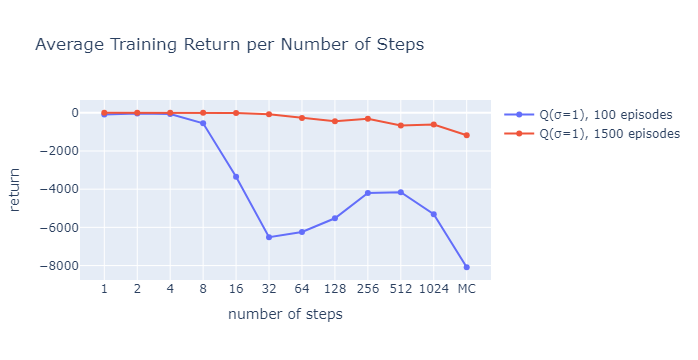

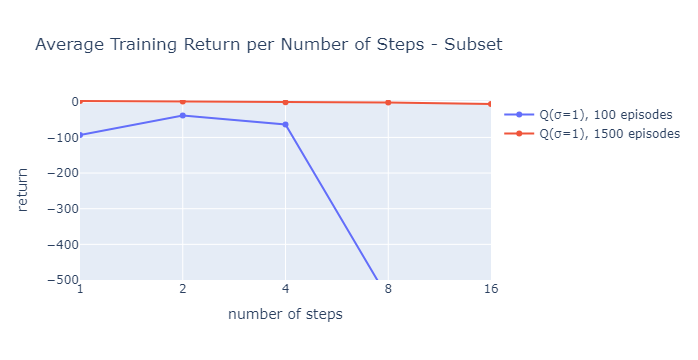

In [44]:
x, y = metric_after_x_episodes('return', -1, metrics_qlearning, metrics_offpolicy_mc, metrics_list_qsigma1)
qsigma1_return_data_2 = {
    'x': x,
    'y': y,
    'name': 'Q(σ=1), 1500 episodes',
    }
plot_figure([qsigma1_return_data, qsigma1_return_data_2], title='Average Training Return per Number of Steps', xtitle='number of steps', ytitle='return')
plot_figure([qsigma1_return_data, qsigma1_return_data_2], title='Average Training Return per Number of Steps - Subset', xtitle='number of steps', ytitle='return', xrange=(0,4), yrange=(-500, 5))

In [45]:
returns = []
x = []
np.random.seed(100)
for n in [1] + num_step_list[:3]:
    qsigma1_agent = nStepQLearningAgent(num_states, num_actions, get_nstep_agent_info(0.1, 0.3, n))
    rl_task_qsigma1 = RLTask(qsigma1_agent, env, MAX_EPISODE_STEPS)
    run_experiment(rl_task_qsigma1, num_runs=1)
    for i in range(5000):
        env.set_seed(i+1)
        R = rl_task_qsigma1.test_episode([metric_objs_test[1]])['return'][0]
        if R > -2000:
            returns.append(R)
            x.append(f"{n}-step Q-Learning")
    env.set_seed(None)
return_df_qsigma1 = pd.DataFrame(data={'n': x, 'return': returns})

100%|██████████| 1501/1501 [00:10<00:00, 146.04it/s]


In [46]:
return_df_qsigma1.groupby("n").mean()

,return
n,
1-step Q-Learning,7.924200
2-step Q-Learning,7.460200
4-step Q-Learning,4.864996
8-step Q-Learning,4.409257


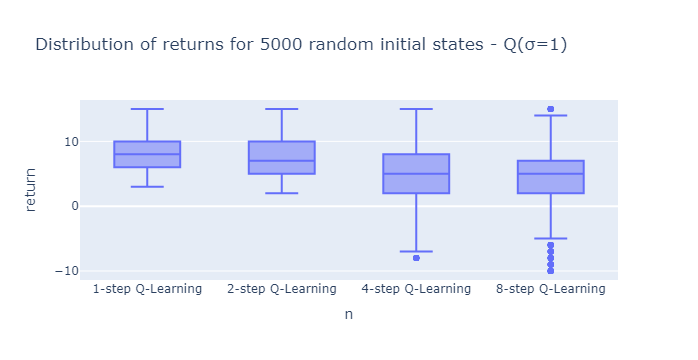

In [58]:
fig = px.box(return_df_qsigma1, x='n', y='return', title='Distribution of returns for 5000 random initial states - Q(σ=1)')
fig.show()

In [48]:
qsigma1_agent_opt = nStepQLearningAgent(num_states, num_actions, get_td0_agent_info(0.1, 0.3))
rl_task_qsigma1_opt = RLTask(qsigma1_agent_opt, env, MAX_EPISODE_STEPS)
metrics_qsigma1_opt = run_experiment(rl_task_qsigma1_opt, metric_objs_test=metric_objs_test, num_runs=1, random_seed=20)

100%|██████████| 1501/1501 [00:02<00:00, 531.80it/s] 


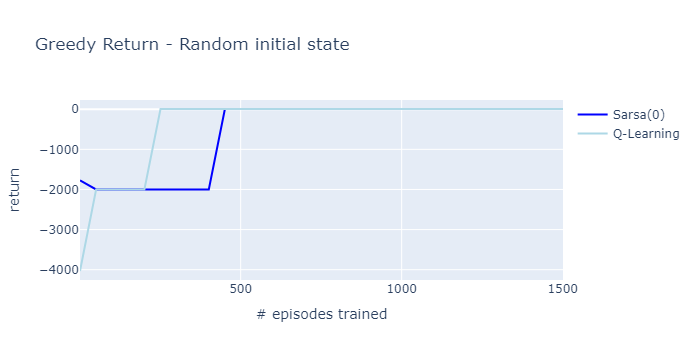

In [49]:
qsigma1_return_data_opt = {
    'x': metrics_qsigma1_opt[2],
    'y': np.squeeze(metrics_qsigma1_opt[1]['return']),
    'name': 'Q-Learning',
    'color': 'lightblue'
    }

plot_figure([onpolicy_return_data_opt, qsigma1_return_data_opt], title='Greedy Return - Random initial state', xtitle='# episodes trained', ytitle='return')

In [50]:
#test_env = TaxiEnv('rgb_array', save=True)
#state, _ = test_env.reset(seed=20)
#test_env.render(save=True)

#action = qsigma1_agent_opt.select_action(state, greedy=True)
#for i in range(MAX_EPISODE_STEPS):
#   state, reward, is_terminal, is_truncated, _ = test_env.step(action)
#   action = qsigma1_agent_opt.select_action(state, greedy=True)
#   test_env.render(save=True)
#   if is_terminal or is_truncated:
#       break

#test_env.close()

#test_env.save_gif("./offpolicy_qsigma1.gif", 300)
#test_env.clean_grids()

## 2.4. Q(σ=0)

In [51]:
def get_qsigma0_agent_info(eps, step_size, num_steps):
    return  {
            'initializer_params': {'init_method': 'zero'},
            'action_selection_params': {
                'method': 'epsilon_greedy',
                'kwargs': {'eps': eps}
            },
            'step_size': step_size,
            'num_steps': num_steps,
            'sigma_func': lambda i: 0
            }

In [52]:
metrics_list_qsigma0 = []
for n in num_step_list:
    qsigma0_agent = nStepQLearningAgent(num_states, num_actions, get_qsigma0_agent_info(0.1, 0.3, n))
    rl_task_qsigma0 = RLTask(qsigma0_agent, env, MAX_EPISODE_STEPS)
    metrics_list_qsigma0.append((n, run_experiment(rl_task_qsigma0, metric_objs, metric_objs_test)))

100%|██████████| 1501/1501 [01:09<00:00, 21.45it/s] 


In [53]:
x, y = metric_after_x_episodes('return', 100, metrics_qlearning, metrics_offpolicy_mc, metrics_list_qsigma0)
qsigma0_return_data = {
    'x': x[1:-1],
    'y': y[1:-1],
    'name': 'Q(σ=0), 100 episodes'
    }

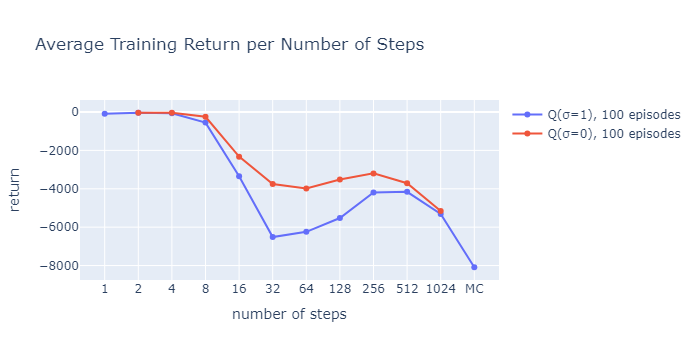

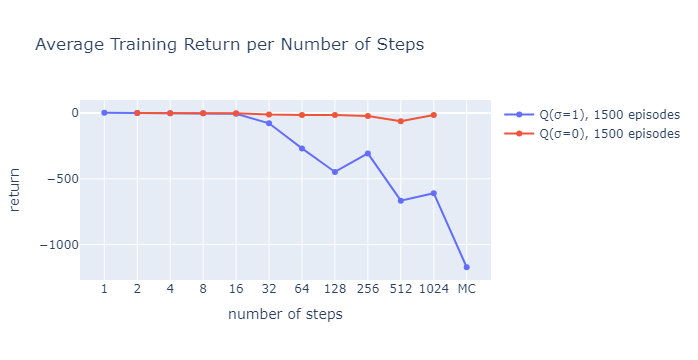

In [54]:
x, y = metric_after_x_episodes('return', -1, metrics_qlearning, metrics_offpolicy_mc, metrics_list_qsigma0)
qsigma0_return_data_2 = {
    'x': x[1:-1],
    'y': y[1:-1],
    'name': 'Q(σ=0), 1500 episodes'
    }
plot_figure([qsigma1_return_data, qsigma0_return_data], title='Average Training Return per Number of Steps', xtitle='number of steps', ytitle='return')
plot_figure([qsigma1_return_data_2, qsigma0_return_data_2], title='Average Training Return per Number of Steps', xtitle='number of steps', ytitle='return')

In [55]:
returns = []
x = []
np.random.seed(100)
for n in [1] + num_step_list[:3]:
    qsigma0_agent = nStepQLearningAgent(num_states, num_actions, get_qsigma0_agent_info(0.1, 0.3, n))
    rl_task_qsigma0 = RLTask(qsigma0_agent, env, MAX_EPISODE_STEPS)
    run_experiment(rl_task_qsigma0, num_runs=1)
    for i in range(5000):
        env.set_seed(i+1)
        R = rl_task_qsigma0.test_episode([metric_objs_test[1]])['return'][0]
        if R > -2000:
            returns.append(R)
            x.append(f"{n}-step Q-Learning")
    env.set_seed(None)
return_df_qsigma0 = pd.DataFrame(data={'n': x, 'return': returns})

100%|██████████| 1501/1501 [00:08<00:00, 166.83it/s]


In [56]:
return_df_qsigma0.groupby("n").mean()

,return
n,
1-step Q-Learning,7.876108
2-step Q-Learning,7.420200
4-step Q-Learning,5.765000
8-step Q-Learning,4.904600


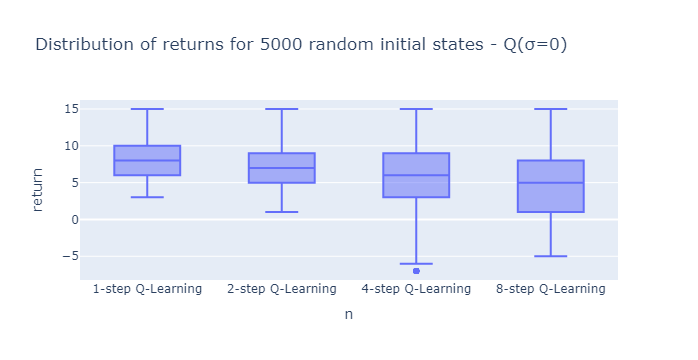

In [57]:
fig = px.box(return_df_qsigma0, x='n', y='return', title='Distribution of returns for 5000 random initial states - Q(σ=0)')
fig.show()